API key from Aplha Vantage: SNZJ2SDXQXEM64SN

In [74]:
import pandas as pd 
import sqlite3 as sq
import requests 

In [75]:
# url = "https://www.alphavantage.co/query?function=TIME_SERIES_INTRADAY&symbol=IBM&interval=1min&apikey=SNZJ2SDXQXEM64SN" #From Alpha Vantage doc
# r = requests.get(url)
# data = r.json()
# # pd.DataFrame(data.get("Time Series (1min)")) # gave table with timestamps as cols and cols(open, high, low, close, vol) as rows
# # So we will transpose it
# pd.DataFrame(data.get("Time Series (1min)")).T


In [76]:
def fetch_intraday_data(ticker, interval = '1min'):
    url = f"https://www.alphavantage.co/query?function=TIME_SERIES_INTRADAY&symbol={ticker}&interval={interval}&apikey=SNZJ2SDXQXEM64SN&outputsize=full"
    r = requests.get(url)
    data = r.json()
    print(data)

    time_series = data.get(f'Time Series ({interval})', {})
    if not time_series:
        print("No data returned for {ticker}")
        return None
    
    df = pd.DataFrame(time_series).T
    df.index.name = 'timestamp'
    df.columns = ['open', 'high', 'low', 'close', 'volume']
    df = df.sort_index()
    df.reset_index(inplace=True) # Reset index to make 'timestamp' a column
    df['ticker'] = ticker
    return df 

fetch_intraday_data('IBM')


{'Meta Data': {'1. Information': 'Intraday (1min) open, high, low, close prices and volume', '2. Symbol': 'IBM', '3. Last Refreshed': '2025-08-26 19:58:00', '4. Interval': '1min', '5. Output Size': 'Full size', '6. Time Zone': 'US/Eastern'}, 'Time Series (1min)': {'2025-08-26 19:58:00': {'1. open': '242.7700', '2. high': '242.7700', '3. low': '242.7700', '4. close': '242.7700', '5. volume': '36'}, '2025-08-26 19:57:00': {'1. open': '242.7000', '2. high': '242.7700', '3. low': '242.7000', '4. close': '242.7700', '5. volume': '90'}, '2025-08-26 19:55:00': {'1. open': '242.6600', '2. high': '242.6600', '3. low': '242.6600', '4. close': '242.6600', '5. volume': '100'}, '2025-08-26 19:53:00': {'1. open': '242.7000', '2. high': '242.7000', '3. low': '242.7000', '4. close': '242.7000', '5. volume': '6'}, '2025-08-26 19:52:00': {'1. open': '242.7000', '2. high': '242.7800', '3. low': '242.7000', '4. close': '242.7800', '5. volume': '51'}, '2025-08-26 19:49:00': {'1. open': '242.7000', '2. high

,timestamp,open,high,low,close,volume,ticker
0,2025-07-28 04:00:00,258.0903,259.5502,257.7228,258.7060,1185,IBM
1,2025-07-28 04:01:00,258.3187,258.7358,258.2691,258.2691,50,IBM
2,2025-07-28 04:02:00,258.7160,258.7954,258.2691,258.6862,147,IBM
3,2025-07-28 04:03:00,258.7060,258.8053,258.3684,258.7458,121,IBM
4,2025-07-28 04:04:00,258.8153,258.8153,258.7060,258.7755,53,IBM
...,...,...,...,...,...,...,...
17157,2025-08-26 19:52:00,242.7000,242.7800,242.7000,242.7800,51,IBM
17158,2025-08-26 19:53:00,242.7000,242.7000,242.7000,242.7000,6,IBM
17159,2025-08-26 19:55:00,242.6600,242.6600,242.6600,242.6600,100,IBM
17160,2025-08-26 19:57:00,242.7000,242.7700,242.7000,242.7700,90,IBM


{'Meta Data': {'1. Information': 'Intraday (1min) open, high, low, close prices and volume', '2. Symbol': 'IBM', '3. Last Refreshed': '2025-08-26 19:58:00', '4. Interval': '1min', '5. Output Size': 'Full size', '6. Time Zone': 'US/Eastern'}, 'Time Series (1min)': {'2025-08-26 19:58:00': {'1. open': '242.7700', '2. high': '242.7700', '3. low': '242.7700', '4. close': '242.7700', '5. volume': '36'}, '2025-08-26 19:57:00': {'1. open': '242.7000', '2. high': '242.7700', '3. low': '242.7000', '4. close': '242.7700', '5. volume': '90'}, '2025-08-26 19:55:00': {'1. open': '242.6600', '2. high': '242.6600', '3. low': '242.6600', '4. close': '242.6600', '5. volume': '100'}, '2025-08-26 19:53:00': {'1. open': '242.7000', '2. high': '242.7000', '3. low': '242.7000', '4. close': '242.7000', '5. volume': '6'}, '2025-08-26 19:52:00': {'1. open': '242.7000', '2. high': '242.7800', '3. low': '242.7000', '4. close': '242.7800', '5. volume': '51'}, '2025-08-26 19:49:00': {'1. open': '242.7000', '2. high

<Axes: title={'center': 'IBM Intraday Stock Prices'}, xlabel='Time', ylabel='Price ($)'>

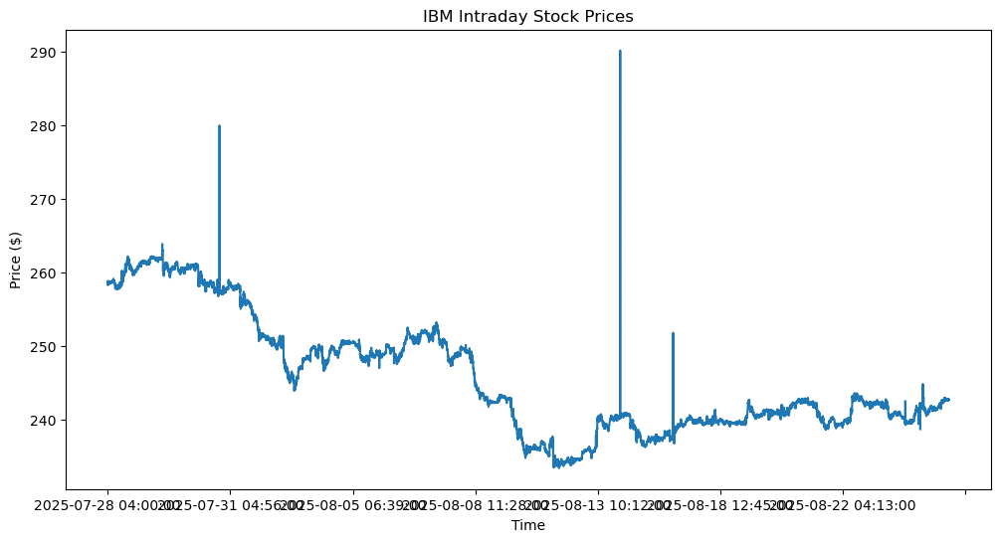

In [77]:
df = fetch_intraday_data('IBM')
df.set_index('timestamp').close.astype(float).plot(figsize=(12,6), title='IBM Intraday Stock Prices', ylabel='Price ($)', xlabel='Time')

In [78]:
conn = sq.connect('Stock_data.db')
cursor = conn.cursor()

cursor.execute('''
CREATE TABLE IF NOT EXISTS stock_prices (
               ticker TEXT,
               timestamp TEXT,
               open REAL,
               high REAL,
               low REAL,
               close REAL,
               volume INTEGER
)
''')

In [79]:
conn.commit()

In [80]:
def get_latest_timestamp(ticker):
    query = '''
    SELECT MAX(timestamp) FROM stock_prices WHERE ticker = ?
'''
    cursor.execute(query, (ticker,))
    result = cursor.fetchone()[0]
    return result


In [81]:
# get_latest_timestamp('IBM')
def store_data_to_db(data, latest_timestamp):
    if data is not None:
        if latest_timestamp:
            data = data[data['timestamp'] > latest_timestamp]
        if not data.empty:
           data.to_sql('stock_prices', conn, if_exists = 'append', index = False)
           print(f"Data from {data['ticker'].iloc[0]} stored successfully")
        else:
            print("No new data to store.")
    else:
        print("No data available to store.")

In [82]:
def main():
    tickers = ["MSFT", "IBM"]
    for ticker in tickers:
        latest_timestamp = get_latest_timestamp(ticker)
        data = fetch_intraday_data(ticker)
        store_data_to_db(data, latest_timestamp)

if __name__ == "__main__":
    main()

{'Meta Data': {'1. Information': 'Intraday (1min) open, high, low, close prices and volume', '2. Symbol': 'MSFT', '3. Last Refreshed': '2025-08-26 19:59:00', '4. Interval': '1min', '5. Output Size': 'Full size', '6. Time Zone': 'US/Eastern'}, 'Time Series (1min)': {'2025-08-26 19:59:00': {'1. open': '503.1500', '2. high': '503.1500', '3. low': '502.8000', '4. close': '503.1400', '5. volume': '663'}, '2025-08-26 19:58:00': {'1. open': '503.0800', '2. high': '503.2000', '3. low': '502.5800', '4. close': '502.8650', '5. volume': '292'}, '2025-08-26 19:57:00': {'1. open': '503.0000', '2. high': '503.0750', '3. low': '502.5800', '4. close': '503.0750', '5. volume': '705'}, '2025-08-26 19:56:00': {'1. open': '502.9500', '2. high': '503.0000', '3. low': '502.9000', '4. close': '502.9400', '5. volume': '245'}, '2025-08-26 19:55:00': {'1. open': '502.9100', '2. high': '503.0000', '3. low': '502.9100', '4. close': '503.0000', '5. volume': '226'}, '2025-08-26 19:54:00': {'1. open': '503.1500', '2

In [83]:
def query_data(ticker, start_time, end_time):
    query = f"""
    SELECT * FROM stock_prices
    WHERE ticker = '{ticker}' 
    AND timestamp BETWEEN '{start_time}' AND '{end_time}'
    order by timestamp
    """

    df = pd.read_sql(query, conn)
    return df

In [84]:
df = query_data('IBM', '2025-08-26 09:30:00', '2025-08-26 16:00:00')
df

,ticker,timestamp,open,high,low,close,volume
0,IBM,2025-08-26 09:30:00,241.020,241.6999,240.7500,241.455,69995
1,IBM,2025-08-26 09:31:00,241.595,242.2450,241.4200,242.245,21024
2,IBM,2025-08-26 09:32:00,242.180,242.7299,241.8800,242.520,18344
3,IBM,2025-08-26 09:33:00,242.430,243.4350,242.3300,243.185,464452
4,IBM,2025-08-26 09:34:00,243.140,243.9000,243.1334,243.715,34896
...,...,...,...,...,...,...,...
384,IBM,2025-08-26 15:56:00,241.850,241.9450,241.8250,241.945,31940
385,IBM,2025-08-26 15:57:00,241.945,242.4200,241.9300,242.380,55506
386,IBM,2025-08-26 15:58:00,242.395,242.5200,242.3400,242.390,87753
387,IBM,2025-08-26 15:59:00,242.380,242.7100,242.3500,242.430,213519


<Axes: title={'center': 'IBM Stock Prices on 2023-10-10'}, xlabel='Time', ylabel='Price ($)'>

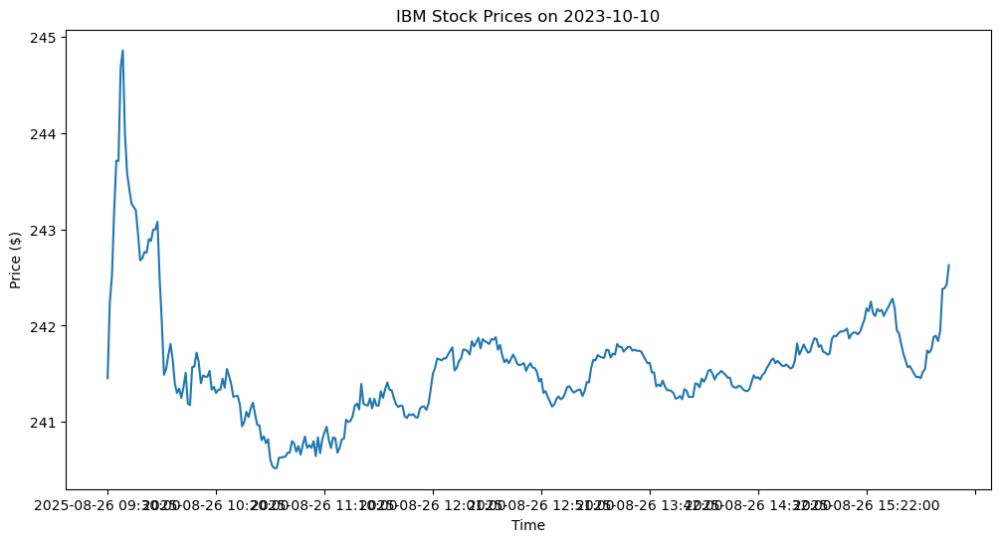

In [85]:
df.set_index('timestamp').close.astype(float).plot(figsize=(12,6), title='IBM Stock Prices on 2023-10-10', ylabel='Price ($)', xlabel='Time')